In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Standardisert treningsoppsett for endometriekreft-tumorsegmentering
– støtter 1-n modaliteter (VIBE, T2, ADC)
"""

# ==============================================================
# Importer biblioteker og parametere
# ==============================================================

# ==========================================================
# Standard library
# ==========================================================
import os
import datetime
import warnings
import shutil
import matplotlib.pyplot as plt

# ==========================================================
# Numerical / data
# ==========================================================
import numpy as np
import pandas as pd

# ==========================================================
# PyTorch / TorchIO
# ==========================================================
import torch
from torch.utils.data import DataLoader
import torchio as tio

# ==========================================================
# MONAI
# ==========================================================
from monai.networks.nets import UNet
from monai.losses import DiceCELoss, DiceLoss

# ==========================================================
# fastai
# ==========================================================
from fastai.data.core import DataLoaders
from fastai.learner import Learner, Metric
from fastai.callback.tracker import EarlyStoppingCallback, SaveModelCallback
from fastai.callback.fp16 import MixedPrecision

# ==========================================================
# Project-specific
# ==========================================================
import params
from datasetgenerator import *
from utils import *


2026-01-13 15:08:27.762013: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2026-01-13 15:08:28.222975: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2026-01-13 15:08:29.505206: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:

# ==============================================================
# 4. PARAMETRE
# ==============================================================
GPU_ID         = 2
batch_size     = 6
img_size       = 192
learning_rate  = 1e-3
n_epochs       = 200
dropout        = 0.1
weight_decay   = 1e-5
patience       = 40
modelname      = "UNet"
monitor_metric = "dice"
nfold          = 5
test_fraction = 0.2


# Hvilke modaliteter som skal brukes i dette eksperimentet
selected_modalities = ["vibe2min","T2","ADC"]

# Hvilket bilde som brukes som referanse
reference = "vibe2min"

# Modalities combined
modalities_str = "_".join(selected_modalities)

In [14]:

# ==============================================================
# 1. Les inn og filtrer datasett
# ==============================================================
df = pd.read_csv(params.pathlistvalid, sep=';').groupby("subj", as_index=False).first()

# Which columsn to require
require = [params.modalities[m]["col"] for m in selected_modalities]
df = datasetgenerator(df, require)

# Only data sets with manual masks
df = df.loc[df.dataset == 'man'].reset_index(drop=True)
print(f"Antall datasett med manuelle masker: {len(df)}")

# ==============================================================
# 2. Bygg dynamiske paths for bilder og masker
# ==============================================================

df["imgpath"] = [
    build_image_path(
        s,
        selected_modalities,
        params.prepathnifti,
        reference,
        params.modalities
    )
    for s in df.subj
]

df["pathmask"] = [
    build_mask_path(s, m, params.prepathnifti, reference)
    for s, m in zip(df.subj, df.pathmask)
]
df.head(3)

578 datasett tilfredsstiller betingelsene
Antall datasett med manuelle masker: 272


,subj,pathvibe2minDicom,pathT2Dicom,pathADCDicom,pathJADNifti,pathKWLNifti,pathVerifiedMLNifti,pathJADMLNifti,pathmask,dataset,imgpath
0,11,fl3d_vibe_tra_2mm_2min,t2_tse_skra_tra_p2,ep2d_diff_adc,011segmentedJulie.nii.gz,None,None,None,/raid/erlend/GynKreft/Data-EC/Nifti/EC011/registered/011segmentedJulie-2-vibe2min-header.nii.gz,man,/raid/erlend/GynKreft/Data-EC/Nifti/EC011/unregistered/vibe2min.nii.gz;/raid/erlend/GynKreft/Data-EC/Nifti/EC011/registered/T2-2-vibe2min-header.nii.gz;/raid/erlend/GynKreft/Data-EC/Nifti/EC011/registered/ADC-2-vibe2min-header.nii.gz
1,17,fl3d_vibe_tra_2mm_2min,t2_tse_skra_tra_p2,ep2d_diff_adc,017segmentedJulie.nii.gz,None,None,None,/raid/erlend/GynKreft/Data-EC/Nifti/EC017/registered/017segmentedJulie-2-vibe2min-header.nii.gz,man,/raid/erlend/GynKreft/Data-EC/Nifti/EC017/unregistered/vibe2min.nii.gz;/raid/erlend/GynKreft/Data-EC/Nifti/EC017/registered/T2-2-vibe2min-header.nii.gz;/raid/erlend/GynKreft/Data-EC/Nifti/EC017/registered/ADC-2-vibe2min-header.nii.gz
2,20,fl3d_vibe_tra_2mm_2min,t2_tse_skra_tra_p2,ep2d_diff_adc,020segmentedJulie.nii.gz,None,None,None,/raid/erlend/GynKreft/Data-EC/Nifti/EC020/registered/020segmentedJulie-2-vibe2min-header.nii.gz,man,/raid/erlend/GynKreft/Data-EC/Nifti/EC020/unregistered/vibe2min.nii.gz;/raid/erlend/GynKreft/Data-EC/Nifti/EC020/registered/T2-2-vibe2min-header.nii.gz;/raid/erlend/GynKreft/Data-EC/Nifti/EC020/registered/ADC-2-vibe2min-header.nii.gz


In [15]:
from tqdm import tqdm
print("🔍 Beregner tumorvolum for alle masker ...")
df["tumorsize"] = [compute_tumor_volume(p) for p in tqdm(df["pathmask"].values)]
print(f"✅ Volum beregnet for {df['tumorsize'].notna().sum()} pasienter.")

🔍 Beregner tumorvolum for alle masker ...


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 272/272 [00:17<00:00, 15.24it/s]

✅ Volum beregnet for 272 pasienter.


In [16]:
from sklearn.model_selection import StratifiedKFold, train_test_split
import numpy as np

# -------------------------------------------------------------
# 1. Fjern NaN og lag kvartiler for stratifisering
# -------------------------------------------------------------
df = df.dropna(subset=["tumorsize"]).reset_index(drop=True)
df["tumorsize_cat"] = pd.qcut(
    df["tumorsize"],
    q=4,
    labels=["Q1_Smallest", "Q2", "Q3", "Q4_Largest"]
)

# -------------------------------------------------------------
# 2. Lag testsett (tas helt ut, brukes kun til endelig evaluering)
# -------------------------------------------------------------
random_state = 42
dftrainval, dftest = train_test_split(
    df,
    test_size=test_fraction,
    stratify=df["tumorsize_cat"],
    random_state=random_state
)

# Reset index slik at StratifiedKFold bruker posisjoner (0–N)
dftrainval = dftrainval.reset_index(drop=True)

# -------------------------------------------------------------
# 3. Lag 5-fold inndeling på dftrainval
# -------------------------------------------------------------
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
dftrainval["fold"] = -1

for i, (_, val_idx) in enumerate(skf.split(dftrainval, dftrainval["tumorsize_cat"])):
    dftrainval.loc[val_idx, "fold"] = i   # <- fungerer nå fordi index = 0..N

print(dftrainval["fold"].value_counts())


fold
0    44
1    44
2    43
4    43
3    43
Name: count, dtype: int64


In [17]:
warnings.filterwarnings("ignore", message="Using TorchIO images without a torchio.SubjectsLoader")

assert torch.cuda.is_available()
torch.cuda.set_device(GPU_ID)
device = torch.device(f"cuda:{GPU_ID}")
print(f"Bruker GPU {device}")

# Time stamp
timestamp = datetime.datetime.now().strftime("%Y%m%d")

# ==============================================================
# 5. 5-FOLD LOOP
# ==============================================================
for fold in range(nfold):

    print(f"\n==========================================================")
    print(f"🚀 Starter Fold {fold+1}/5")
    print("==========================================================")

    df_train = dftrainval[dftrainval.fold != fold]
    df_val   = dftrainval[dftrainval.fold == fold]

    # ==========================================================
    # ---- LOADERS ----
    # ==========================================================
    train_dl = get_dataloader(df_train, batch_size, img_size, selected_modalities, augment=True)
    val_dl   = get_dataloader(df_val,   batch_size, img_size, selected_modalities, augment=False)

    dls = DataLoaders(train_dl, val_dl, num_workers = 0, device=device)
    dls.n_inp = 1

    # ==========================================================
    # ---- MODELL ----
    # ==========================================================
    model = monai_unet_model(in_channels=len(selected_modalities)).to(device)

    # ==========================================================
    # ---- METRIC (samme som enkel-koden) ----
    # ==========================================================
    metric = ThresholdedDice()
    if not hasattr(metric, "name"):
        metric.__dict__["name"] = "dice"

    # For lagring
    basename = f"{modelname}_{modalities_str}_{params.version}_fold{fold+1}_{timestamp}"    
    save_dir = os.path.join(params.prepathmodels, basename)
    os.makedirs(save_dir, exist_ok=True)
    
    # ==========================================================
    # ---- LEARNER ----
    # ==========================================================
    learn = Learner(
        dls,
        model,
        loss_func=DiceLoss(sigmoid=True),
        metrics=[metric],
        path=save_dir,      # 👈 viktig
        model_dir=".",      # 👈 lagre i save_dir
        cbs=[
            SaveModelCallback(
                monitor="dice",
                comp=np.greater,
                fname="best_model"
            ),
            EarlyStoppingCallback(
                monitor="dice",
                comp=np.greater,
                patience=patience
            )
    ],
    )
    
    # ==========================================================
    # ---- TRENING ----
    # ==========================================================
    learn.fit_one_cycle(n_epochs, lr_max=learning_rate, wd=weight_decay)
    learn.load("best_model")

    # ==========================================================
    # ---- LAGRING ----
    # ========================================================== 
    rec = learn.recorder
    values = np.array(rec.values)   # shape: (epochs, 2 + n_metrics)    
    epochs = range(1, len(values) + 1)
    train_loss = values[:, 0]
    valid_loss = values[:, 1]
    dice_vals  = values[:, 2]
    df_metrics = pd.DataFrame({
        "epoch": epochs,
        "train_loss": train_loss,
        "valid_loss": valid_loss,
        "dice": dice_vals,
        "fold": fold + 1,
    })
    metrics_csv = os.path.join(save_dir, f"training_metrics_fold{fold+1}.csv")
    df_metrics.to_csv(metrics_csv, index=False)    
    print(f"📊 Dice-tabell lagret: {metrics_csv}")
    
    
    model_path = os.path.join(save_dir, "model.pth")
    torch.save(model.state_dict(), model_path)
    
    save_training_artifacts(
        save_dir,
        basename,
        timestamp,
        batch_size,
        img_size,
        selected_modalities,
        df_train,
        df_val,
        dftest,
        model_path,
        modelname,
        dropout,
        learning_rate,
        n_epochs,
        fold=fold+1,        
    )

    import shutil
    shutil.copy("train_UNet_Monai_ensemble.ipynb", save_dir)

    # ==========================================================
    # ---- LOSS PLOT ----
    # ==========================================================
    ax = learn.recorder.plot_loss()
    fig = ax.figure
    fig.savefig(os.path.join(save_dir, "loss_curve.png"), dpi=150, bbox_inches="tight")
    plt.close(fig)
    
    # ==========================================================
    # ---- DICE PLOT ----
    # ==========================================================
    metrics_vals = learn.recorder.values
    epochs_list  = list(range(1, len(metrics_vals)+1))
    dice_vals    = [m[2] for m in metrics_vals]

    plt.figure(figsize=(8,5))
    plt.plot(epochs_list, dice_vals, "o-", label="Validation Dice")
    plt.xlabel("Epoch")
    plt.ylabel("Dice score")
    plt.legend()
    plt.grid()
    plt.savefig(os.path.join(save_dir, "dice_curve.png"), dpi=150, bbox_inches="tight")
    plt.close()


print("\n🎯 FERDIG — alle 5 folds kjørt.")


Bruker GPU cuda:2

🚀 Starter Fold 1/5


epoch,train_loss,valid_loss,dice,time
0,0.995722,0.991804,0.010074,04:18
1,0.995305,0.990868,0.012525,04:11
2,0.994897,0.989805,0.014440,04:29
3,0.994248,0.988259,0.016024,04:22
4,0.993727,0.987356,0.018165,04:10
5,0.993046,0.986958,0.019972,04:18
6,0.992583,0.986652,0.021354,04:28
7,0.992313,0.986513,0.022023,04:10
8,0.992261,0.986320,0.024174,04:17
9,0.992112,0.986221,0.026611,04:27


Better model found at epoch 0 with dice value: 0.010073605400975794.
Better model found at epoch 1 with dice value: 0.012524932768428698.
Better model found at epoch 2 with dice value: 0.01444008773250971.
Better model found at epoch 3 with dice value: 0.016024065349483863.
Better model found at epoch 4 with dice value: 0.018165325513109565.
Better model found at epoch 5 with dice value: 0.01997155701974407.
Better model found at epoch 6 with dice value: 0.021353563643060625.
Better model found at epoch 7 with dice value: 0.022022758843377233.
Better model found at epoch 8 with dice value: 0.024173783196602017.
Better model found at epoch 9 with dice value: 0.026611409208271652.
Better model found at epoch 10 with dice value: 0.028764956688974053.
Better model found at epoch 11 with dice value: 0.03454080113442615.
Better model found at epoch 13 with dice value: 0.03703906462760642.
Better model found at epoch 14 with dice value: 0.05026395618915558.
Better model found at epoch 15 with

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
Saved file doesn't contain an optimizer state.



🚀 Starter Fold 2/5


epoch,train_loss,valid_loss,dice,time
0,0.992786,0.991967,0.011030,03:11
1,0.992399,0.991352,0.013385,03:16
2,0.991575,0.991155,0.016344,03:17
3,0.991098,0.990990,0.018104,03:12
4,0.991026,0.990867,0.021067,03:09
5,0.990959,0.990766,0.023730,03:14
6,0.990671,0.990723,0.026361,03:16
7,0.990598,0.990624,0.028756,03:17
8,0.990421,0.990544,0.032681,03:13
9,0.990374,0.990500,0.033647,03:14


Better model found at epoch 0 with dice value: 0.011029573099222034.
Better model found at epoch 1 with dice value: 0.013384670775849372.
Better model found at epoch 2 with dice value: 0.016344208968803287.
Better model found at epoch 3 with dice value: 0.018103915150277317.
Better model found at epoch 4 with dice value: 0.021067147492431104.
Better model found at epoch 5 with dice value: 0.02373007801361382.
Better model found at epoch 6 with dice value: 0.026360728545114398.
Better model found at epoch 7 with dice value: 0.028755736770108342.
Better model found at epoch 8 with dice value: 0.032680626725777984.
Better model found at epoch 9 with dice value: 0.03364689624868333.
Better model found at epoch 10 with dice value: 0.042088817805051804.
Better model found at epoch 11 with dice value: 0.04597365972585976.
Better model found at epoch 12 with dice value: 0.04823052627034485.
Better model found at epoch 13 with dice value: 0.048591865692287683.
Better model found at epoch 14 wit

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 39 with dice value: 0.06685555842705071.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 42 with dice value: 0.07080785417929292.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 43 with dice value: 0.08560099545866251.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 44 with dice value: 0.1041953070089221.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 46 with dice value: 0.10425617452710867.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 48 with dice value: 0.11300640925765038.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 49 with dice value: 0.11975304037332535.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 50 with dice value: 0.14877585973590612.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 52 with dice value: 0.15738387499004602.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 53 with dice value: 0.15887374337762594.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 54 with dice value: 0.16202721931040287.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 55 with dice value: 0.19929673243314028.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 56 with dice value: 0.2155681224539876.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 57 with dice value: 0.21959453728049994.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 59 with dice value: 0.36321529746055603.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 61 with dice value: 0.5018698535859585.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 62 with dice value: 0.5030808597803116.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 63 with dice value: 0.5826625637710094.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 64 with dice value: 0.5945335403084755.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 66 with dice value: 0.6124908030033112.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 68 with dice value: 0.6301966160535812.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 69 with dice value: 0.6377337276935577.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 70 with dice value: 0.6646274924278259.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 73 with dice value: 0.6746263280510902.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 76 with dice value: 0.6794296354055405.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 77 with dice value: 0.6845477260649204.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 80 with dice value: 0.6883415579795837.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 81 with dice value: 0.6946621909737587.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 86 with dice value: 0.7074718549847603.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 87 with dice value: 0.7103256806731224.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 89 with dice value: 0.7106080502271652.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 90 with dice value: 0.723374530673027.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 94 with dice value: 0.7248448804020882.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 105 with dice value: 0.730011947453022.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 106 with dice value: 0.7310690209269524.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 107 with dice value: 0.7334420680999756.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 113 with dice value: 0.7367469593882561.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 116 with dice value: 0.7508264109492302.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 128 with dice value: 0.7537605836987495.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 134 with dice value: 0.7576136589050293.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

Better model found at epoch 153 with dice value: 0.7576732635498047.


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1460, in _shutdown_workers
    if w.is_alive():
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f3b8a97dee0>
Traceback (most recent call last):
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1477, in __del__
    self._shutdown_workers()
  File "/home/erlend/anaconda3/envs/monai/lib/python3.8/s

No improvement since epoch 153: early stopping
📊 Dice-tabell lagret: /raid/erlend/Dropbox/Precision_Imaging_in_Gynecologic_Cancer/EC/MonaiSegmentation/models/UNet_vibe2min_T2_ADC_v01_fold2_20260108/training_metrics_fold2.csv


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
Saved file doesn't contain an optimizer state.



🚀 Starter Fold 3/5


epoch,train_loss,valid_loss,dice,time
0,0.993259,0.993478,0.006854,03:28
1,0.991866,0.992752,0.009440,03:31
2,0.991423,0.992535,0.011239,03:30
3,0.990994,0.992392,0.012655,03:26
4,0.990740,0.992284,0.015203,03:23
5,0.990379,0.992223,0.014972,03:27
6,0.990308,0.992109,0.020582,03:25
7,0.990159,0.992024,0.023529,03:30
8,0.989943,0.991991,0.024670,03:34
9,0.990027,0.991903,0.031305,03:28


Better model found at epoch 0 with dice value: 0.006853824539575726.
Better model found at epoch 1 with dice value: 0.009440103865927085.
Better model found at epoch 2 with dice value: 0.011238568928092718.
Better model found at epoch 3 with dice value: 0.012655032653128728.
Better model found at epoch 4 with dice value: 0.015202714304905385.
Better model found at epoch 6 with dice value: 0.02058217575540766.
Better model found at epoch 7 with dice value: 0.023528861172962934.
Better model found at epoch 8 with dice value: 0.02467026701197028.
Better model found at epoch 9 with dice value: 0.03130514279473573.
Better model found at epoch 10 with dice value: 0.03297107794787735.
Better model found at epoch 11 with dice value: 0.037967215524986386.
Better model found at epoch 12 with dice value: 0.04326633189339191.
Better model found at epoch 18 with dice value: 0.04551313945557922.
Better model found at epoch 39 with dice value: 0.05799465940799564.
Better model found at epoch 40 with 

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
Saved file doesn't contain an optimizer state.



🚀 Starter Fold 4/5


epoch,train_loss,valid_loss,dice,time
0,0.993733,0.993716,0.011461,03:28
1,0.992398,0.992320,0.014713,03:33
2,0.991488,0.991704,0.017702,03:33
3,0.990977,0.991480,0.019678,03:32
4,0.990549,0.991307,0.021079,03:24
5,0.990411,0.991235,0.022100,03:30
6,0.990297,0.991176,0.026005,03:20
7,0.990263,0.991102,0.029235,03:30
8,0.990070,0.991064,0.033602,03:30
9,0.989836,0.990998,0.038075,03:22


Better model found at epoch 0 with dice value: 0.011461022717412561.
Better model found at epoch 1 with dice value: 0.014713129319716245.
Better model found at epoch 2 with dice value: 0.01770236814627424.
Better model found at epoch 3 with dice value: 0.01967794622760266.
Better model found at epoch 4 with dice value: 0.02107861085096374.
Better model found at epoch 5 with dice value: 0.022099753841757774.
Better model found at epoch 6 with dice value: 0.026004919782280922.
Better model found at epoch 7 with dice value: 0.02923494135029614.
Better model found at epoch 8 with dice value: 0.03360165166668594.
Better model found at epoch 9 with dice value: 0.03807493136264384.
Better model found at epoch 10 with dice value: 0.043781590880826116.
Better model found at epoch 11 with dice value: 0.047235498670488596.
Better model found at epoch 12 with dice value: 0.04746310506016016.
Better model found at epoch 13 with dice value: 0.05113042937591672.
Better model found at epoch 14 with di

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
Saved file doesn't contain an optimizer state.



🚀 Starter Fold 5/5


epoch,train_loss,valid_loss,dice,time
0,0.994964,0.996446,0.003729,03:28
1,0.994862,0.996429,0.003843,03:29
2,0.994857,0.996416,0.003974,03:27
3,0.994764,0.996401,0.004129,03:23
4,0.994740,0.996372,0.004376,03:22
5,0.994665,0.996261,0.004892,03:23
6,0.994443,0.995828,0.005906,03:31
7,0.994136,0.995154,0.006353,03:26
8,0.993498,0.994850,0.007047,03:28
9,0.992992,0.994759,0.007650,03:19


Better model found at epoch 0 with dice value: 0.0037294052890501916.
Better model found at epoch 1 with dice value: 0.0038426399987656623.
Better model found at epoch 2 with dice value: 0.0039735147438477725.
Better model found at epoch 3 with dice value: 0.004128857457544655.
Better model found at epoch 4 with dice value: 0.004375657270429656.
Better model found at epoch 5 with dice value: 0.004892314842436463.
Better model found at epoch 6 with dice value: 0.00590555282542482.
Better model found at epoch 7 with dice value: 0.006352591561153531.
Better model found at epoch 8 with dice value: 0.007046906277537346.
Better model found at epoch 9 with dice value: 0.007650202431250364.
Better model found at epoch 10 with dice value: 0.008036135754082352.
Better model found at epoch 11 with dice value: 0.010165302839595824.
Better model found at epoch 12 with dice value: 0.010936577862594277.
Better model found at epoch 13 with dice value: 0.013420766976196319.
Better model found at epoch 

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
Saved file doesn't contain an optimizer state.



🎯 FERDIG — alle 5 folds kjørt.


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
Using TorchIO images without a torchio.SubjectsLoader in PyTorch >= 2.3 might have unexpected consequences, e.g., the collated batches will be i

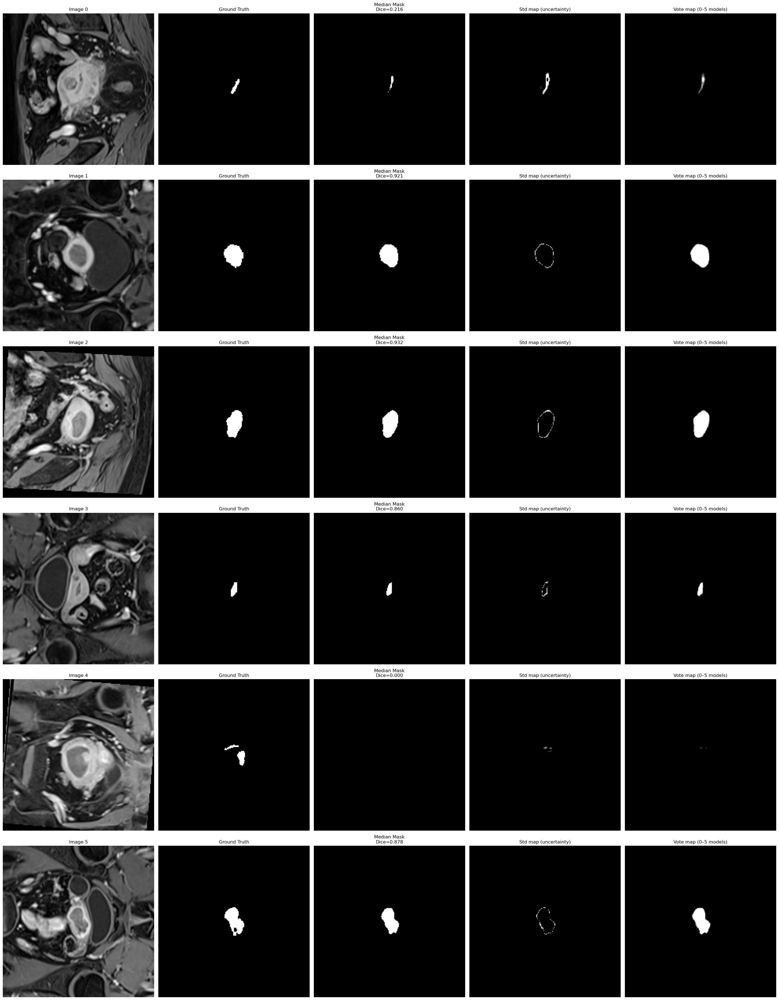

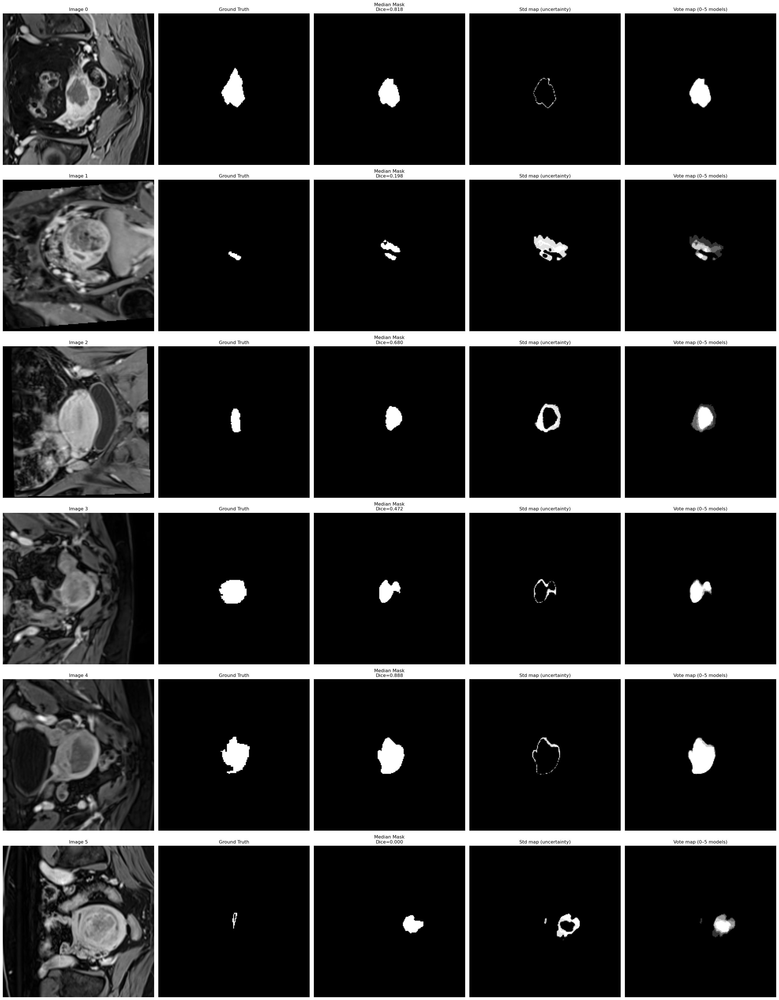

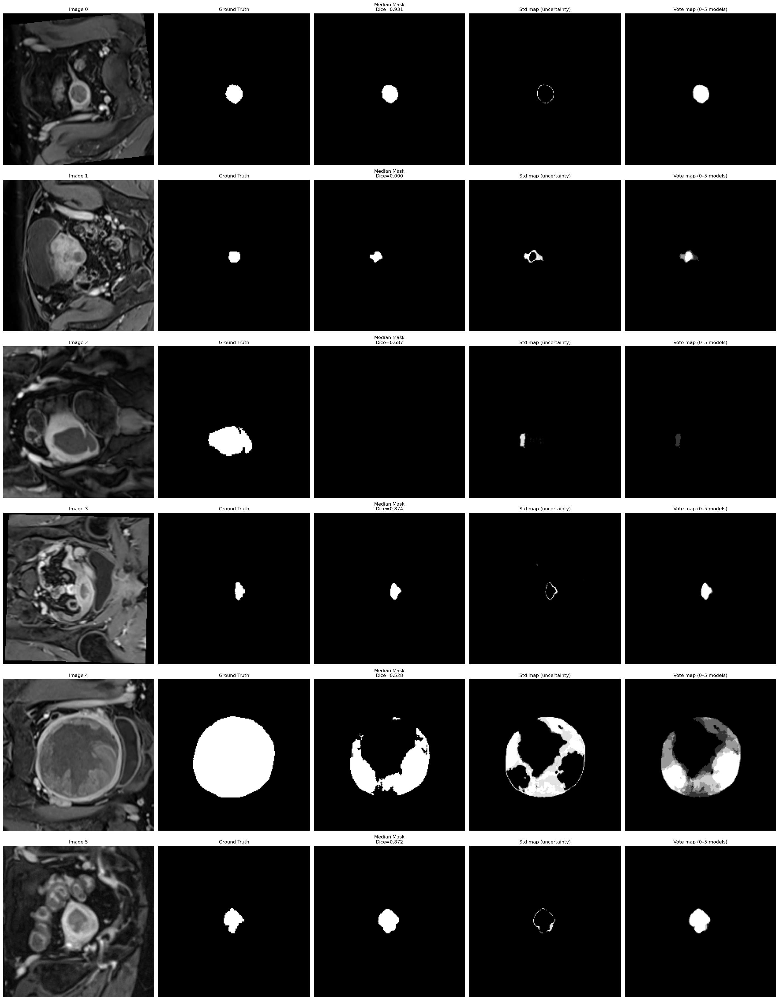

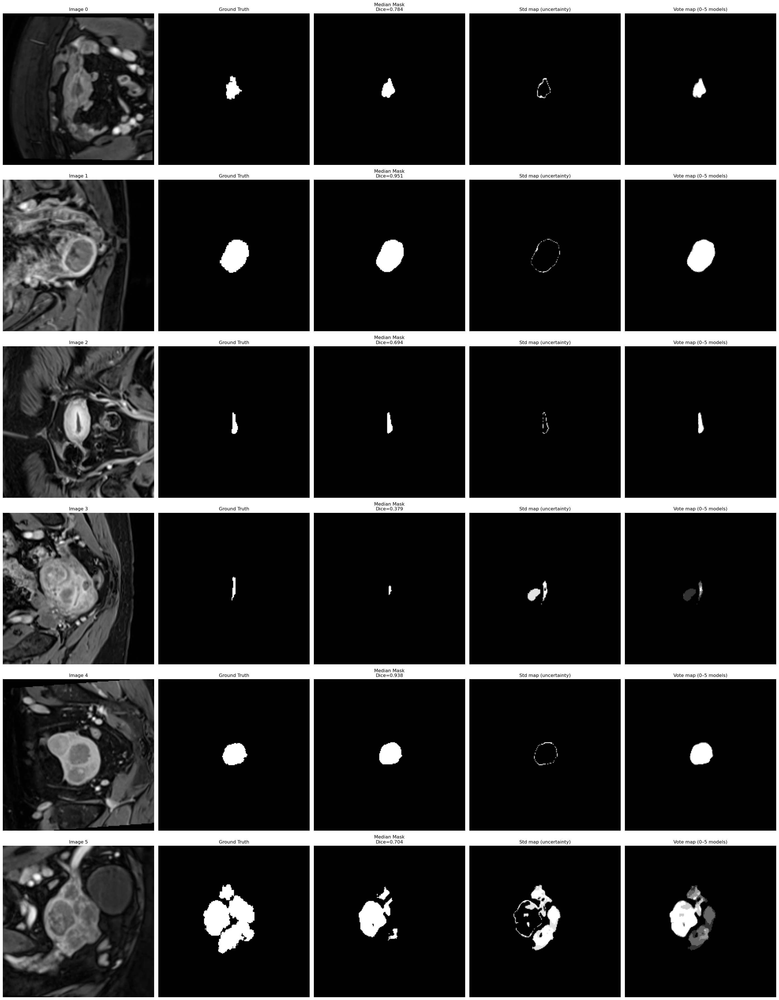

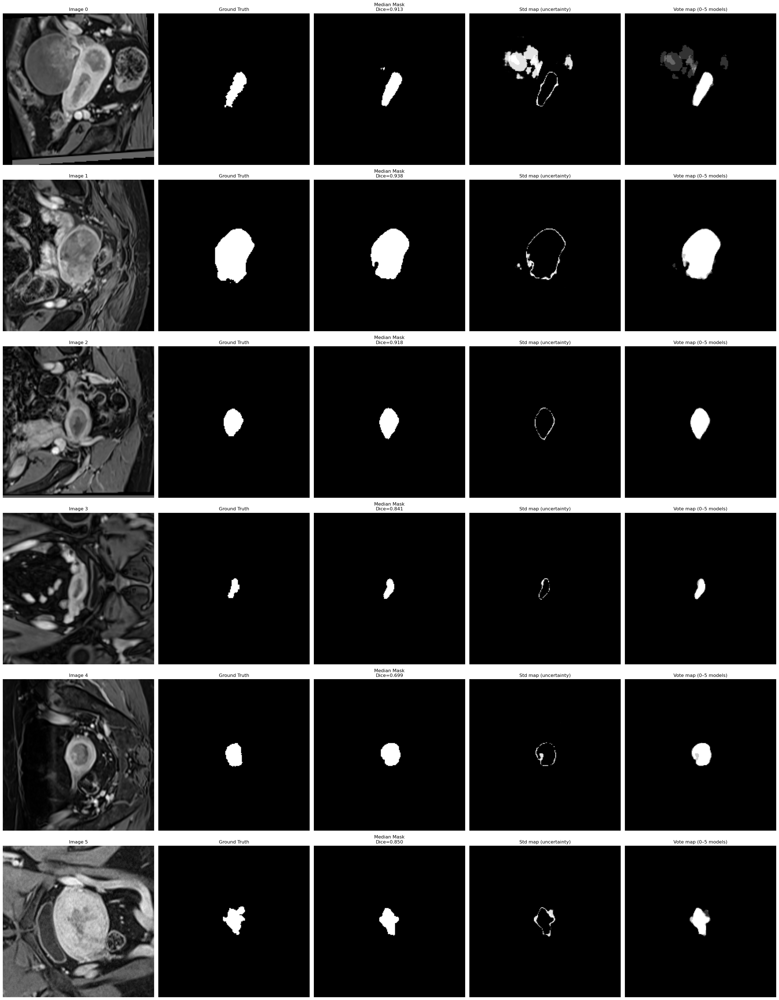

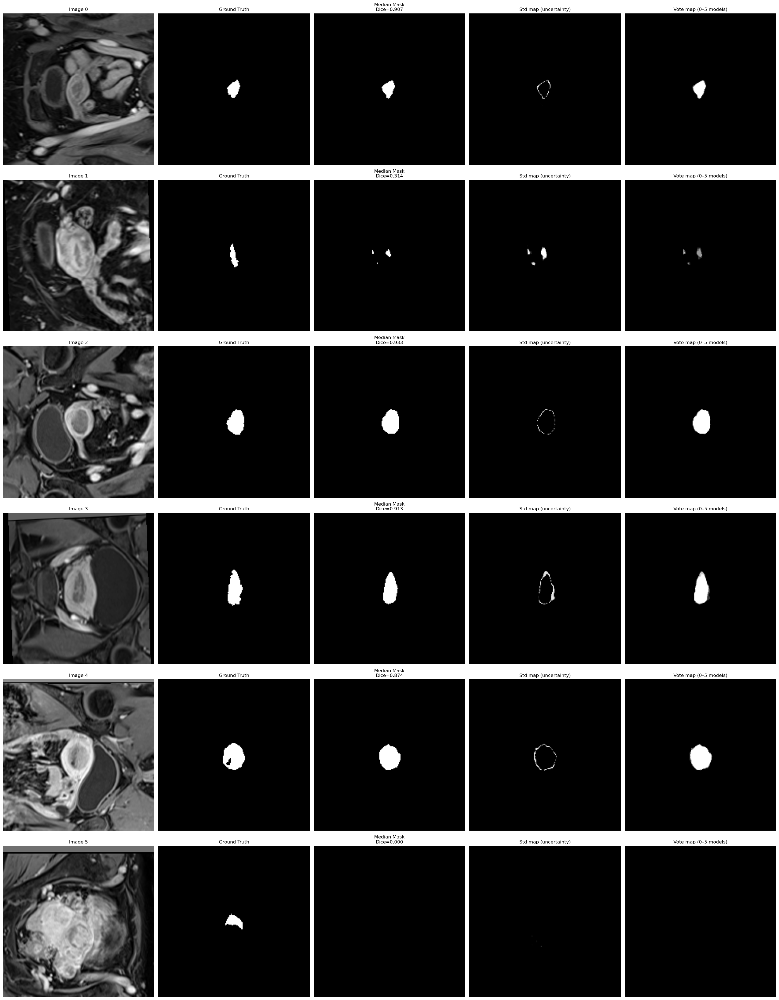

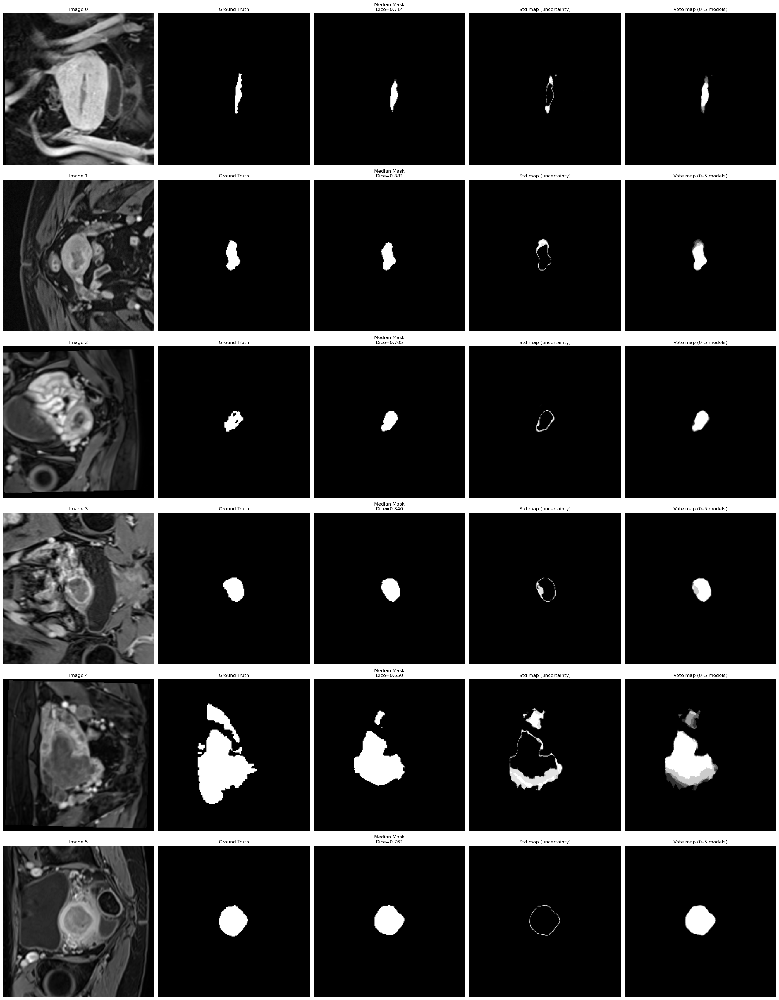

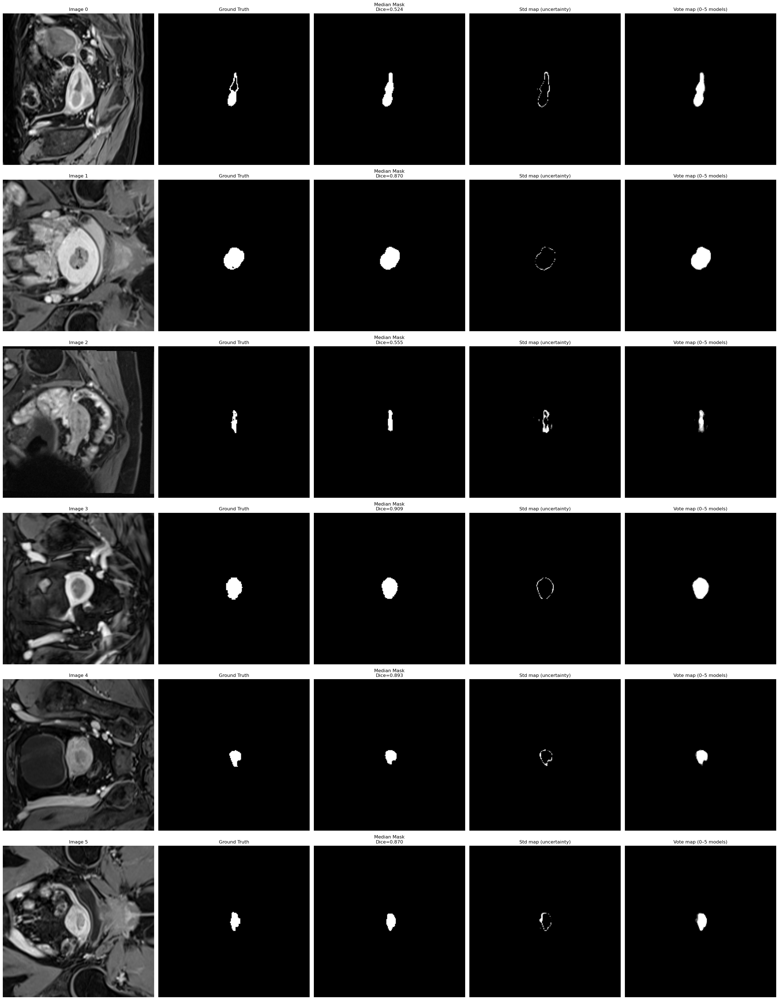

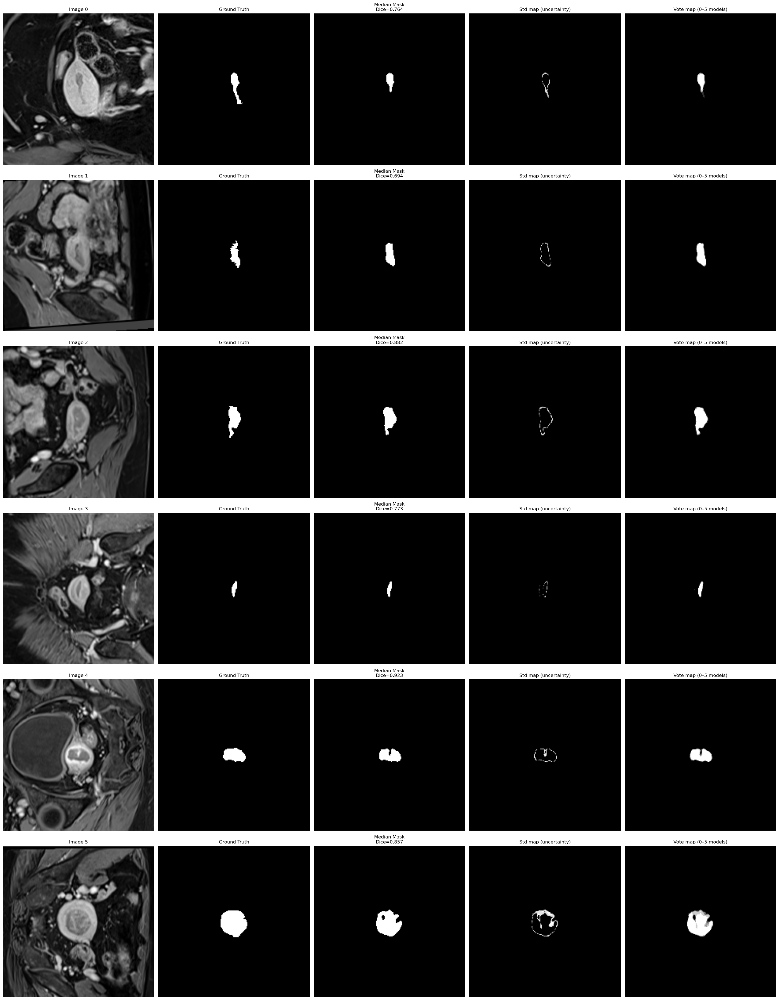


🔥 Ensemble Mean Dice: 0.7105



In [6]:
import os
def load_models(model_paths, in_channels, device):
    models = []
    for mp in model_paths:
        m = monai_unet_model(in_channels=in_channels)
        m.load_state_dict(torch.load(mp, map_location=device))
        m.to(device)
        m.eval()
        models.append(m)
    return models


# ----------------------------------------------------------
# Dice score
# ----------------------------------------------------------
def compute_dice_score(preds, targets, threshold=0.5, apply_sigmoid=True):
    if apply_sigmoid:
        preds = torch.sigmoid(preds)
    preds = (preds > threshold).float()
    targets = targets.float()
    eps = 1e-8

    dice_scores = []
    for i in range(preds.shape[0]):
        inter = (preds[i] * targets[i]).sum().float()
        union = preds[i].sum().float() + targets[i].sum().float()
        dice = (2 * inter + eps) / (union + eps)
        dice_scores.append(dice.item())
    return dice_scores
    
def ensemble_predict(models, images):
    preds = []
    with torch.no_grad():
        for m in models:
            p = torch.sigmoid(m(images))   # (B,1,Z,Y,X)
            preds.append(p)

    stacked = torch.stack(preds, dim=0)    # (M,B,1,Z,Y,X)
    median_pred = torch.median(stacked, dim=0).values
    std_pred    = torch.std(stacked, dim=0)

    return median_pred, std_pred

def compute_vote_map(models, images):
    """
    Returnerer en stemmekart-matrise (vote map):
    antall modeller (0–M) som predikerer masken > 0.5.
    Output shape: (B,1,Z,Y,X)
    """
    votes = None
    with torch.no_grad():
        for m in models:
            p = torch.sigmoid(m(images))        # (B,1,Z,Y,X)
            binary = (p > 0.5).float()          # stemme: 0 eller 1
            if votes is None:
                votes = binary
            else:
                votes += binary                  # teller stemmer

    return votes
def plot_ensemble_result(images, gts, median_pred, std_pred, vote_map, dice_list, nfold, threshold=0.5):
    images = images.cpu().numpy()
    gts = gts.cpu().numpy()
    median_pred = median_pred.cpu().numpy()
    std_pred = std_pred.cpu().numpy()
    vote_map = vote_map.cpu().numpy()

    B = images.shape[0]
    fig, axes = plt.subplots(B, 5, figsize=(28, 6*B))

    if B == 1:
        axes = axes[np.newaxis, :]

    for i in range(B):
        gt = gts[i, 0]
        z = gt.sum(axis=(0, 1)).argmax()

        img_slice  = images[i, 0, :, :, z]
        gt_slice   = gts[i, 0, :, :, z]
        med_slice  = (median_pred[i, 0, :, :, z] > threshold).astype(float)
        std_slice  = std_pred[i, 0, :, :, z]
        vote_slice = vote_map[i, 0, :, :, z]     # always 0–5

        # 1) Original image
        axes[i, 0].imshow(img_slice, cmap="gray")
        axes[i, 0].set_title(f"Image {i}")
        axes[i, 0].axis("off")

        # 2) Ground truth
        axes[i, 1].imshow(gt_slice, cmap="gray")
        axes[i, 1].set_title("Ground Truth")
        axes[i, 1].axis("off")

        # 3) Median prediction
        axes[i, 2].imshow(med_slice, cmap="gray")
        axes[i, 2].set_title(f"Median Mask\nDice={dice_list[i]:.3f}")
        axes[i, 2].axis("off")

        # 4) Std map (uncertainty)
        axes[i, 3].imshow(std_slice, cmap="gray", vmin=0, vmax=0.5)
        axes[i, 3].set_title("Std map (uncertainty)")
        axes[i, 3].axis("off")

        # 5) Vote map (0–5) in grayscale with fixed range
        axes[i, 4].imshow(vote_slice, cmap="gray", vmin=0, vmax=nfold)
        axes[i, 4].set_title("Vote map (0–5 models)")
        axes[i, 4].axis("off")

    plt.tight_layout()
    plt.show()
    
    
def evaluate_test_set_ensemble(model_paths, dftest, batch_size, img_size, device, nfold, threshold=0.5):
    
    models = load_models(model_paths, in_channels=len(selected_modalities), device=device)

    test_dl = get_dataloader(dftest, batch_size, img_size, selected_modalities, augment=True)
    
    all_dice = []

    with torch.no_grad():
        for batch in test_dl:
            images, targets = batch
            images = images.to(device)
            targets = targets.to(device)

            # Ensemble outputs
            median_pred, std_pred = ensemble_predict(models, images)

            # 🔥 THIS IS THE MISSING LINE
            vote_map = compute_vote_map(models, images)

            # Dice from median prediction
            dice_list = compute_dice_score(
                median_pred,
                targets,
                apply_sigmoid=False,
                threshold=threshold
            )
            all_dice.extend(dice_list)

            # Plot with vote_map
            plot_ensemble_result(
                images,
                targets,
                median_pred,
                std_pred,
                vote_map,      # <-- correct argument
                dice_list,
                nfold,
                threshold
            )

    print("\n============================")
    print(f"🔥 Ensemble Mean Dice: {np.mean(all_dice):.4f}")
    print("============================\n")

    return all_dice

timestamp = '20260108'
nfold = 5
model_paths = []
for i in range(nfold):
    name = os.path.join(params.prepathmodels, f"{modelname}_{modalities_str}_{params.version}_fold{i+1}_{timestamp}", "model.pth")
    model_paths.append(name)
    if i == 0:
        name = os.path.join(params.prepathmodels, f"{modelname}_{modalities_str}_{params.version}_fold{i+1}_{timestamp}", "dftest.csv")
        dftest = pd.read_csv(name)

device = torch.device("cuda:0")

# Predict images
dice_scores = evaluate_test_set_ensemble(
    model_paths=model_paths,
    dftest=dftest,
    batch_size=batch_size,
    img_size=img_size,
    device=device,
    nfold=nfold,
    threshold=0.5,
)



In [ ]:
dice_scores